# Manual Architecture

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import glob
import numpy as np
import pandas as pd
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Activation
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense

In [3]:
AppleBlackRot = 'dataset/train/Apple_Black_rot'
CedarAppleRust = 'dataset/train/Apple_Cedar_apple_rust'
AppleHealthy = 'dataset/train/Apple_healthy'
ApplePowderyMildew = 'dataset/train/Apple_Powdery_mildew'
AppleScab = 'dataset/train/Apple_scab'
PepperBellBacterialSpot = 'dataset/train/Pepper,_bell_Bacterial_spot'
PepperBellHealthy = 'dataset/train/Pepper,_bell_healthy'
TomatoBacteralSpot = 'dataset/train/Tomato_Bacterial_spot'
TomatoEarlyBlight = 'dataset/train/Tomato_Early_blight'
TomatoHealthy = 'dataset/train/Tomato_healthy'
TomatoLateBlight = 'dataset/train/Tomato_Late_blight'
TomatoLeafMold = 'dataset/train/Tomato_Leaf_Mold'

In [4]:
def plot_images(item_dir, n=6):
    all_item_dir = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dir][:n]
    
    plt.figure(figsize=(80, 40))
    for idx, img_path in enumerate(item_files):
        plt.subplot(7, n, idx+1)
        img = plt.imread(img_path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()

In [5]:
def Images_details_Print_data(data, path):
    print(" ====== Images in: ", path)    
    for k, v in data.items():
        print("%s:\t%s" % (k, v))

def Images_details(path):
    files = [f for f in glob.glob(path + "**/*.*", recursive=True)]
    data = {}
    data['images_count'] = len(files)
    data['min_width'] = 10**100  # No image will be bigger than that
    data['max_width'] = 0
    data['min_height'] = 10**100  # No image will be bigger than that
    data['max_height'] = 0


    for f in files:
        im = Image.open(f)
        width, height = im.size
        data['min_width'] = min(width, data['min_width'])
        data['max_width'] = max(width, data['max_height'])
        data['min_height'] = min(height, data['min_height'])
        data['max_height'] = max(height, data['max_height'])

    Images_details_Print_data(data, path)


Trainned data for AppleBlackRot:

 ====== Images in:  dataset/train/Apple_Black_rot
images_count:	500
min_width:	256
max_width:	2672
min_height:	256
max_height:	2672



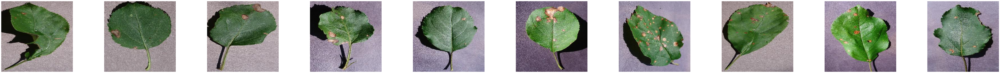

In [6]:
print("")
print("Trainned data for AppleBlackRot:")
print("")
Images_details(AppleBlackRot)
print("")
plot_images(AppleBlackRot, 10)


Trainned data for CedarAppleRust:

 ====== Images in:  dataset/train/Apple_Cedar_apple_rust
images_count:	500
min_width:	256
max_width:	4032
min_height:	256
max_height:	4032



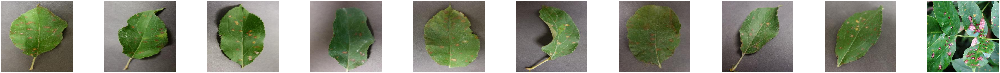

In [7]:
print("")
print("Trainned data for CedarAppleRust:")
print("")
Images_details(CedarAppleRust)
print("")
plot_images(CedarAppleRust, 10)


Trainned data for PepperBellBacterialSpot:

 ====== Images in:  dataset/train/Pepper,_bell_Bacterial_spot
images_count:	500
min_width:	242
max_width:	3648
min_height:	200
max_height:	3648



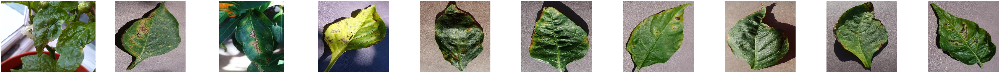

In [11]:
print("")
print("Trainned data for PepperBellBacterialSpot:")
print("")
Images_details(PepperBellBacterialSpot)
print("")
plot_images(PepperBellBacterialSpot, 10)


Trainned data for TomatoBacteralSpot:

 ====== Images in:  dataset/train/Tomato_Bacterial_spot
images_count:	500
min_width:	250
max_width:	1024
min_height:	196
max_height:	1024



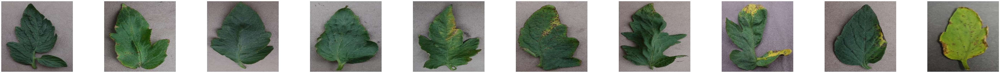

In [13]:
print("")
print("Trainned data for TomatoBacteralSpot:")
print("")
Images_details(TomatoBacteralSpot)
print("")
plot_images(TomatoBacteralSpot, 10)

In [18]:
train_datagen=ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)
test_datagen=ImageDataGenerator(rescale=1./255)

In [19]:
training_set=train_datagen.flow_from_directory('dataset/train',target_size=(224,224),batch_size=32,class_mode='categorical')
test_set=test_datagen.flow_from_directory('dataset/test',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 6000 images belonging to 12 classes.
Found 1200 images belonging to 12 classes.


In [21]:
callbacks = [ModelCheckpoint("Manual.h5", monitor='accuracy', verbose=1, save_best_only=True)]

In [22]:
Classifier=Sequential()
Classifier.add(Conv2D(filters=12, input_shape=(224,224,3), kernel_size=(5,5), strides=(4,4), padding='valid'))
Classifier.add(MaxPooling2D(pool_size=(4,4)))
Classifier.add(Activation('relu'))
Classifier.add(Flatten())
Classifier.add(Dense(24, activation='relu'))
Classifier.add(Dense(12, activation='softmax'))
Classifier.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['accuracy'])

In [23]:
epochs = 20
batch_size = 32

In [24]:
#### Fitting the model
history = Classifier.fit(
           training_set, steps_per_epoch=training_set.samples // batch_size, 
           epochs=epochs, 
           validation_data=test_set,validation_steps=test_set.samples // batch_size, callbacks=callbacks)

Epoch 1/20
187/187 [==============================] - 136s 726ms/step - loss: 2.2157 - accuracy: 0.2445 - val_loss: 1.7390 - val_accuracy: 0.4586

Epoch 00001: accuracy improved from -inf to 0.24447, saving model to Manual.h5
Epoch 2/20
187/187 [==============================] - 141s 753ms/step - loss: 1.6592 - accuracy: 0.4514 - val_loss: 1.3439 - val_accuracy: 0.5752

Epoch 00002: accuracy improved from 0.24447 to 0.45141, saving model to Manual.h5
Epoch 3/20
187/187 [==============================] - 132s 708ms/step - loss: 1.3763 - accuracy: 0.5395 - val_loss: 1.1519 - val_accuracy: 0.6377

Epoch 00003: accuracy improved from 0.45141 to 0.53954, saving model to Manual.h5
Epoch 4/20
187/187 [==============================] - 129s 692ms/step - loss: 1.2071 - accuracy: 0.6017 - val_loss: 1.0597 - val_accuracy: 0.6579

Epoch 00004: accuracy improved from 0.53954 to 0.60171, saving model to Manual.h5
Epoch 5/20
187/187 [==============================] - 132s 707ms/step - loss: 1.1032 - 

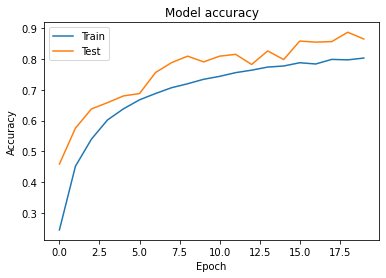

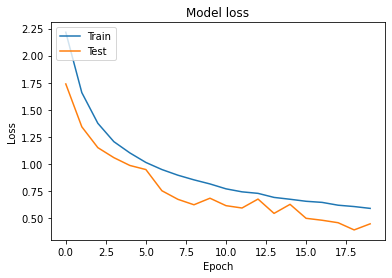

In [25]:
def plot():
    #Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

    # Plot training & validation loss values
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
plot()